In [ ]:
import os
import keras
import numpy as np
import tensorflow as tf

os.environ["KERAS_BACKEND"] = "tensorflow"

from matplotlib import pyplot as plt
from keras.applications import vgg19

from IPython.display import display, Image, clear_output
import PIL.Image

Algunas imágenes que vamos a utilizar

In [ ]:
# Imagenes de contenido/estilo. Se pueden ver en los directorios contents/ y styles/
content_urls = dict(
    labrador = 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg',
    gato1 = 'https://upload.wikimedia.org/wikipedia/commons/e/e5/Blue-eyed_domestic_cat_%28Felis_silvestris_catus%29.jpg',
    gato2 = 'https://upload.wikimedia.org/wikipedia/commons/0/0e/Felis_silvestris_silvestris.jpg',
    messi = 'https://www.aljazeera.com/wp-content/uploads/2022/12/SSS10784_1.jpg'
)

style_urls = dict(
  kanagawa_great_wave='https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg',
  kandinsky_composition_7='https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg',
  hubble_pillars_of_creation='https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg',
  van_gogh_starry_night='https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',
  turner_nantes='https://upload.wikimedia.org/wikipedia/commons/b/b7/JMW_Turner_-_Nantes_from_the_Ile_Feydeau.jpg',
  munch_scream='https://upload.wikimedia.org/wikipedia/commons/c/c5/Edvard_Munch%2C_1893%2C_The_Scream%2C_oil%2C_tempera_and_pastel_on_cardboard%2C_91_x_73_cm%2C_National_Gallery_of_Norway.jpg',
  picasso_demoiselles_avignon='https://upload.wikimedia.org/wikipedia/en/4/4c/Les_Demoiselles_d%27Avignon.jpg',
  picasso_violin='https://upload.wikimedia.org/wikipedia/en/3/3c/Pablo_Picasso%2C_1911-12%2C_Violon_%28Violin%29%2C_oil_on_canvas%2C_Kr%C3%B6ller-M%C3%BCller_Museum%2C_Otterlo%2C_Netherlands.jpg',
  picasso_bottle_of_rum='https://upload.wikimedia.org/wikipedia/en/7/7f/Pablo_Picasso%2C_1911%2C_Still_Life_with_a_Bottle_of_Rum%2C_oil_on_canvas%2C_61.3_x_50.5_cm%2C_Metropolitan_Museum_of_Art%2C_New_York.jpg',
  fire='https://upload.wikimedia.org/wikipedia/commons/3/36/Large_bonfire.jpg',
  derkovits_woman_head='https://upload.wikimedia.org/wikipedia/commons/0/0d/Derkovits_Gyula_Woman_head_1922.jpg',
  amadeo_style_life='https://upload.wikimedia.org/wikipedia/commons/8/8e/Untitled_%28Still_life%29_%281913%29_-_Amadeo_Souza-Cardoso_%281887-1918%29_%2817385824283%29.jpg',
  derkovtis_talig='https://upload.wikimedia.org/wikipedia/commons/3/37/Derkovits_Gyula_Talig%C3%A1s_1920.jpg',
  amadeo_cardoso='https://upload.wikimedia.org/wikipedia/commons/7/7d/Amadeo_de_Souza-Cardoso%2C_1915_-_Landscape_with_black_figure.jpg',
  islamic='https://upload.wikimedia.org/wikipedia/commons/d/d6/Samarkand_Shah-i_Zinda_Tuman_Aqa_complex_cropped2.jpg',
  mandala='https://upload.wikimedia.org/wikipedia/commons/8/80/Mandala_monte_verita.jpg',
  arg='https://www.shutterstock.com/shutterstock/photos/2359179649/display_1500/stock-vector-argentina-flag-pattern-design-vector-illustration-2359179649.jpg'
)

Algunas funciones/clases útiles

In [ ]:
# Clase para cargar una imagen desde una URL, reescalearla y
# preprocesarla/deprocesarla para usar como input de la red VGG19
class ImageLoader:
    def __init__(self, url=None, img_nrows=400):
        if url is not None:
            self.img = keras.utils.get_file(os.path.basename(url)[-128:], url)
            self.width, self.height = keras.utils.load_img(self.img).size
        else:
            self.width, self.height = img_nrows, img_nrows
        self.img_nrows = img_nrows
        self.img_ncols = int(self.width * self.img_nrows / self.height)

    def preprocess_image(self):
        img = keras.utils.load_img(self.img, target_size=(self.img_nrows, self.img_ncols))
        img = keras.utils.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = vgg19.preprocess_input(img)
        self.processed_img = tf.convert_to_tensor(img)
        return self.processed_img

    def deprocess_image(self):
        x = self.processed_img.numpy().reshape((self.img_nrows, self.img_ncols, 3))
        x[:, :, 0] += 103.939
        x[:, :, 1] += 116.779
        x[:, :, 2] += 123.68
        x = x[:, :, ::-1]
        x = np.clip(x, 0, 255).astype("uint8")
        return x

    def display_image(self):
        display(Image(self.img))

# Clase para crear una imagen aleatoria (ruido) y preprocesarla/deprocesarla
class RandomImage(ImageLoader):
    def __init__(self, img_nrows=400, img_ncols=400):
        super().__init__(url=None, img_nrows=img_nrows)
        self.img_ncols = img_ncols
        self.img = np.random.randint(256, size=(img_nrows, img_ncols, 3), dtype=np.uint8)

    def preprocess_image(self):
        self.img = np.expand_dims(self.img, axis=0)
        self.processed_img = tf.convert_to_tensor(vgg19.preprocess_input(self.img))
        return self.processed_img

    def display_image(self):
        plt.imshow(self.img)
        plt.axis("off")
        plt.show()


2928969/2928969 [==============================] - 0s 0us/step
Imagen original:


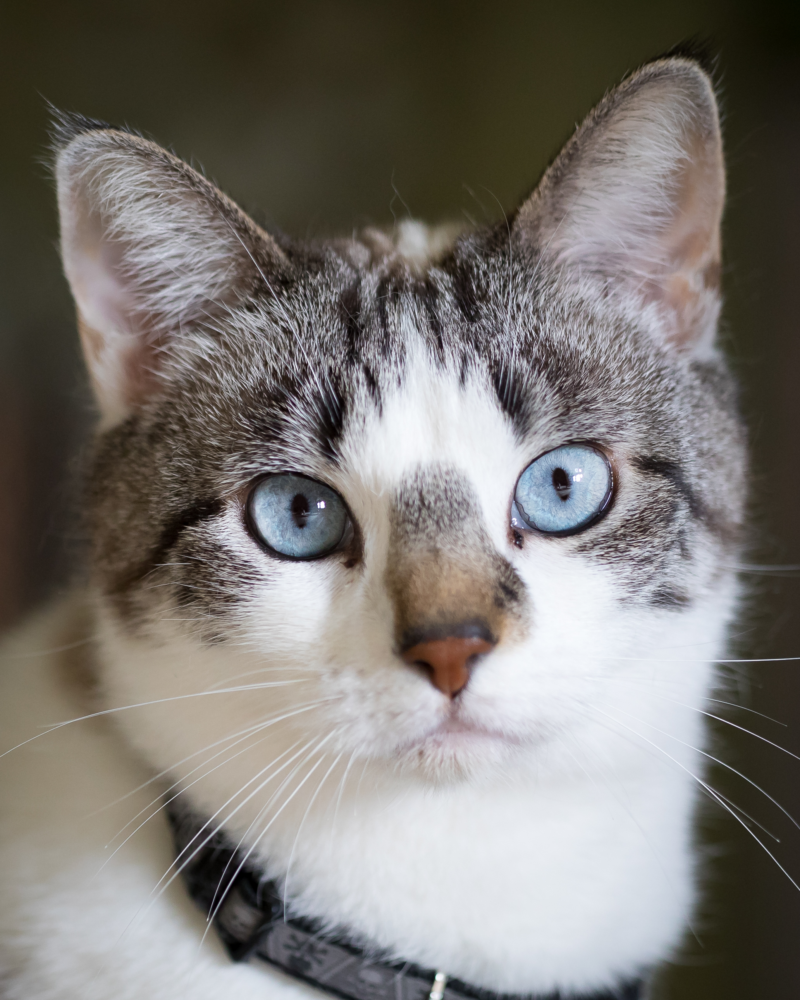

Imagen procesada->deprocesada (reescaleo):


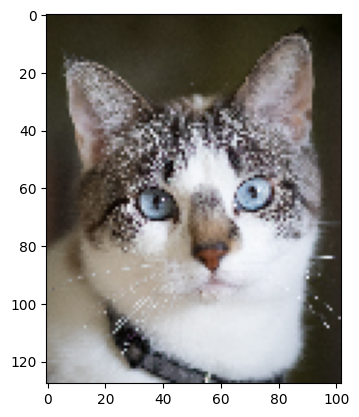

In [ ]:
example_img = ImageLoader(url=content_urls['gato1'], img_nrows=128)
print("Imagen original:")
example_img.display_image()
example_img.preprocess_image()
deprocessed_img = example_img.deprocess_image()
print("Imagen procesada->deprocesada (reescaleo):")
plt.imshow(deprocessed_img)

## Parte 1: Que aprende una red convolucional?

Empecemos mirando lo más fácil: veamos los mapas de activación de distintas capas

In [ ]:
# Creo un modelo vgg
model = vgg19.VGG19(weights="imagenet", input_shape=(example_img.img_nrows, example_img.img_ncols, 3), include_top=False)
model.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 102, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 128, 102, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 128, 102, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 64, 51, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 64, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 64, 51, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 32, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 32, 25, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 32, 25, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 32, 25, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 32, 25, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 16, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 16, 12, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 16, 12, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 16, 12, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 16, 12, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 8, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 8, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 8, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 8, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 8, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 3, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

Activaciones de la capa block1_conv1


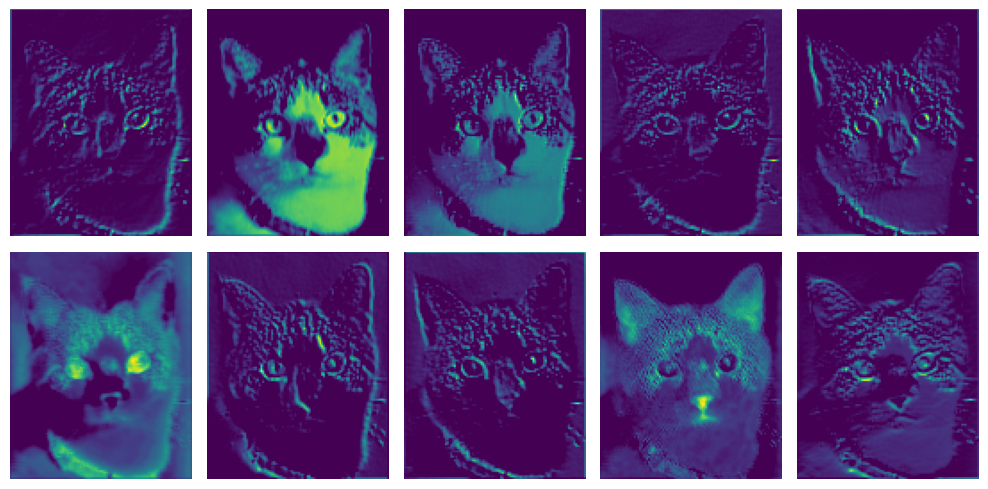

Activaciones de la capa block1_conv2


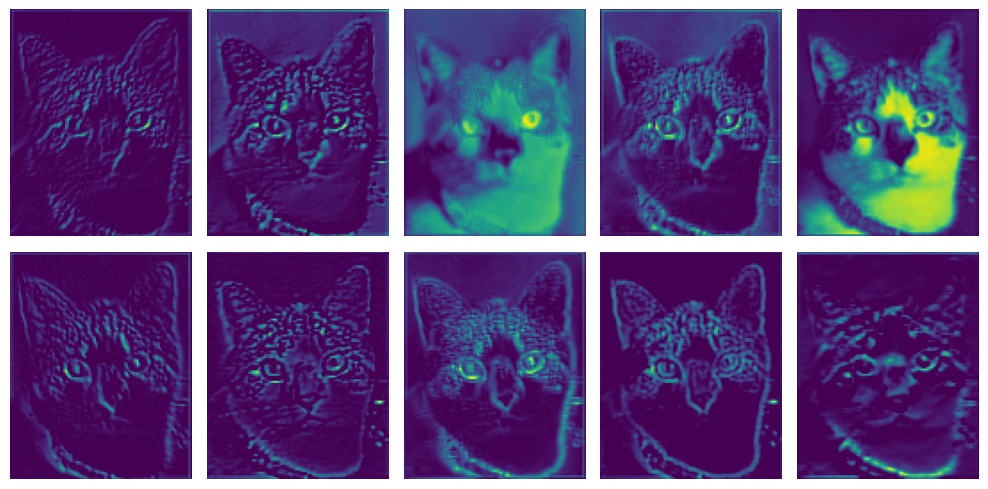

Activaciones de la capa block1_pool


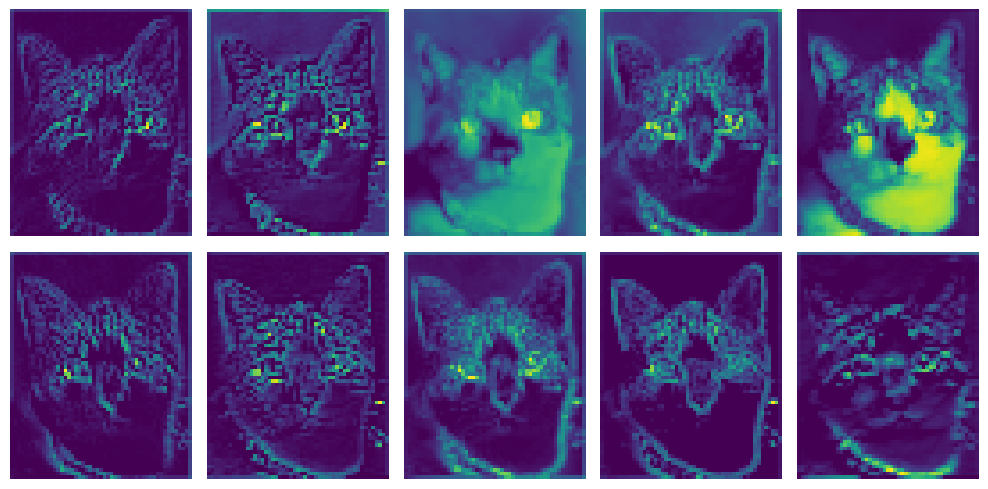

Activaciones de la capa block2_conv1


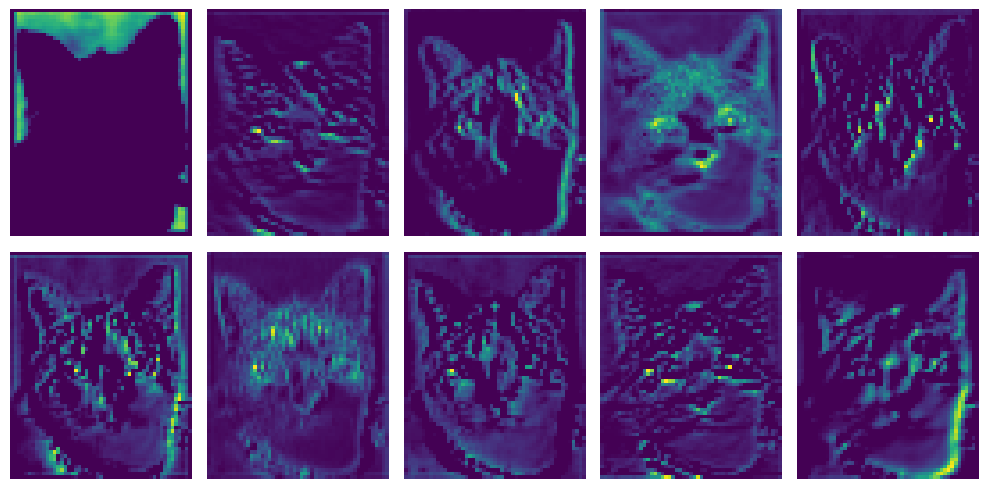

Activaciones de la capa block2_pool


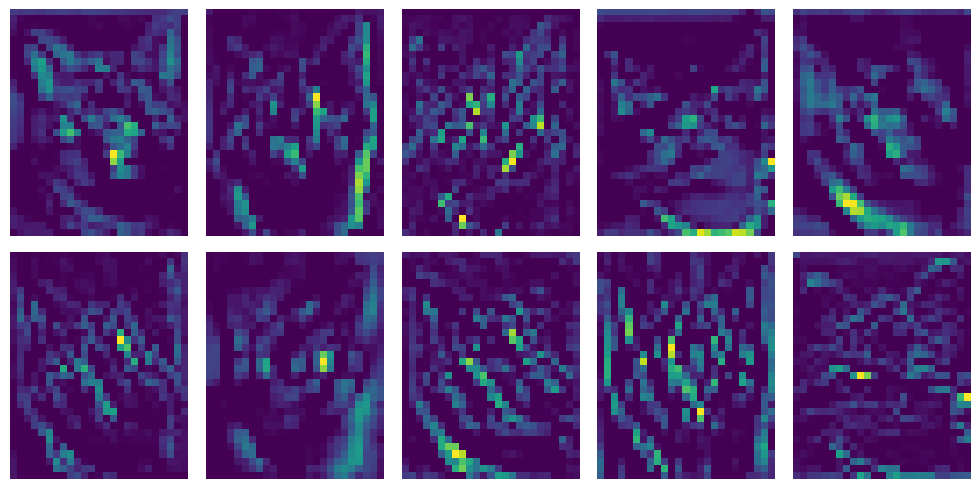

Activaciones de la capa block3_conv1


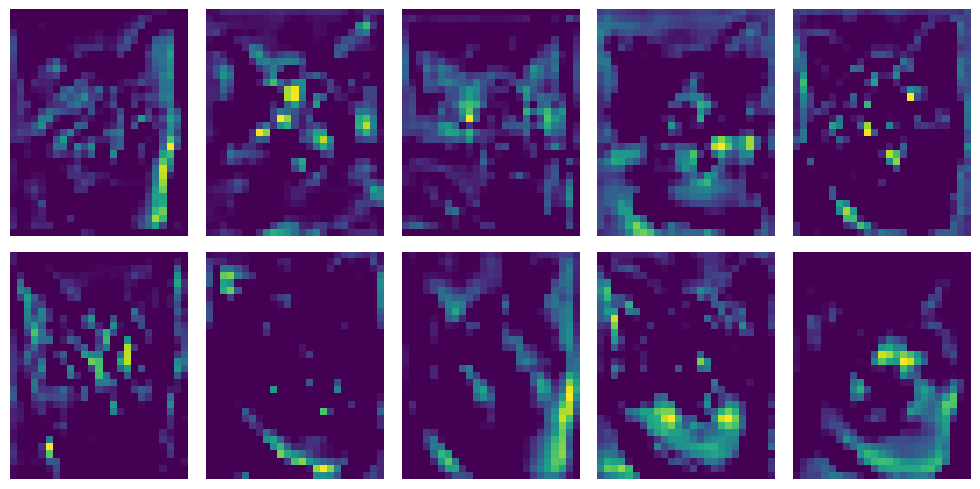

Activaciones de la capa block3_pool


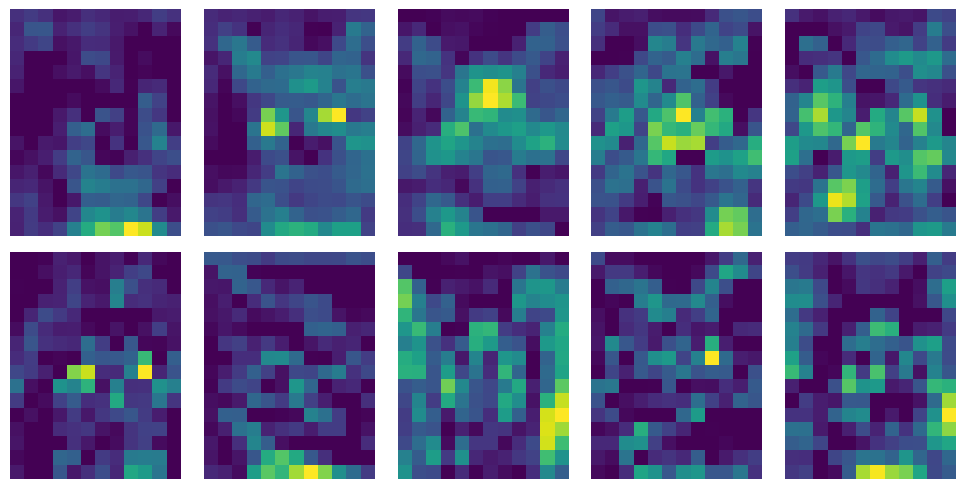

Activaciones de la capa block4_conv1


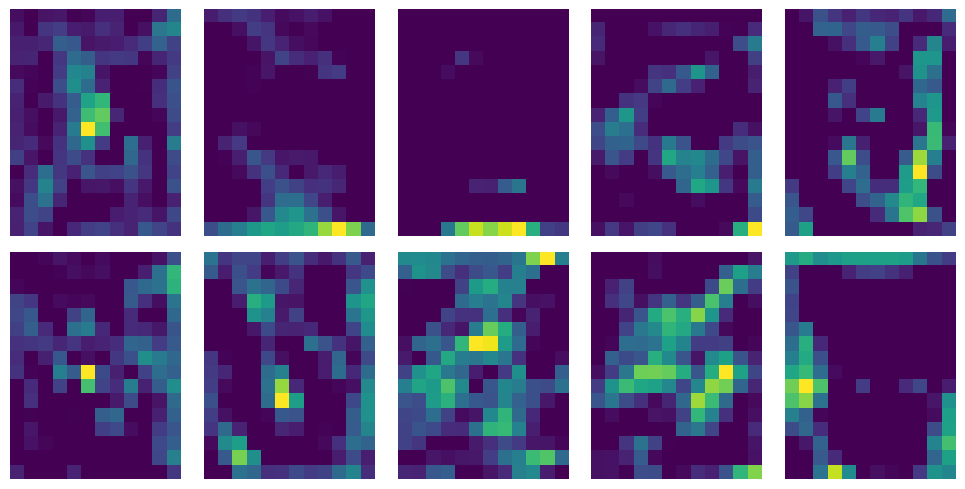

Activaciones de la capa block4_pool


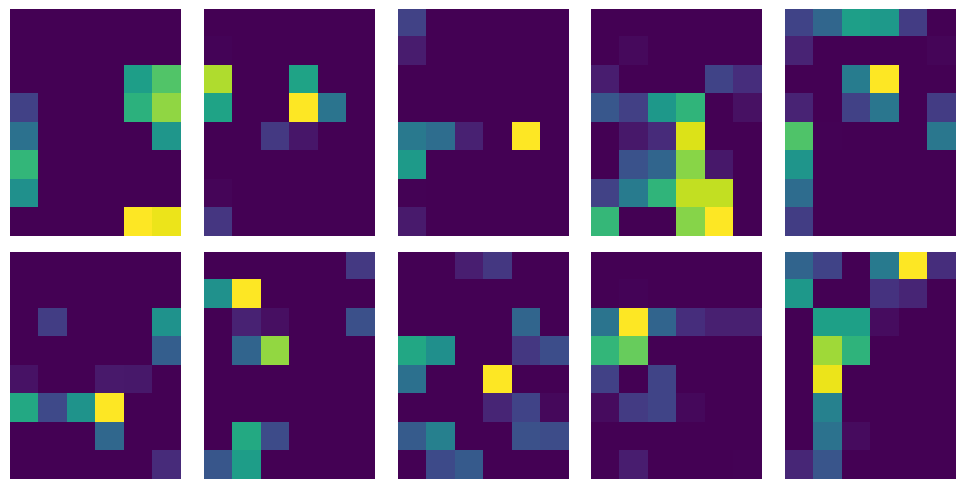

Activaciones de la capa block5_conv1


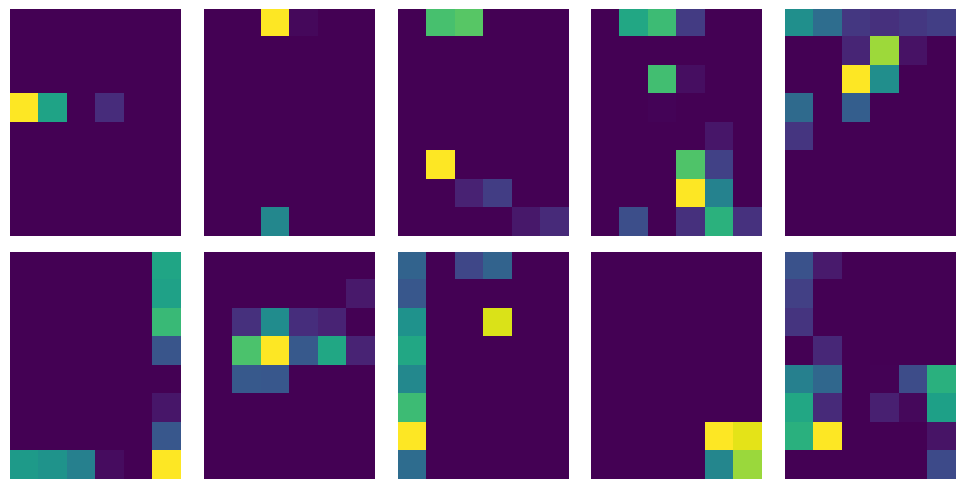

Activaciones de la capa block5_pool


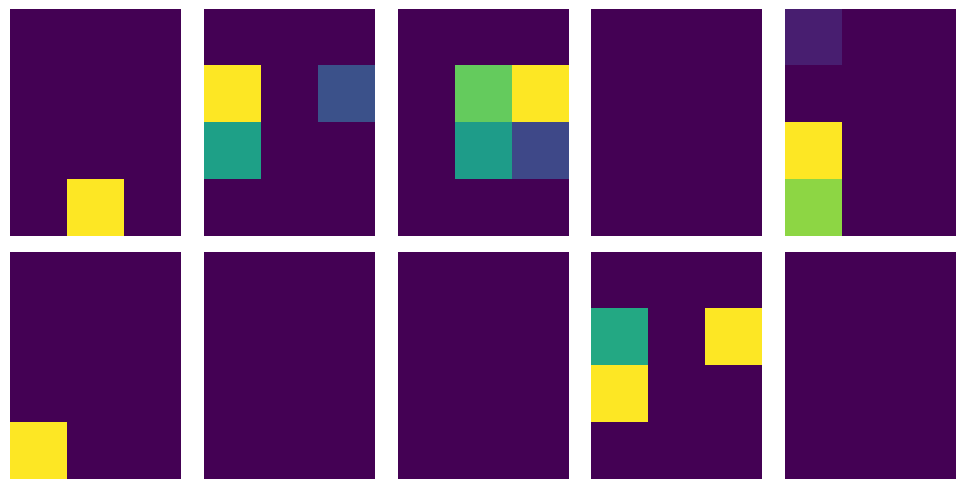

In [ ]:
# Creo un modelo que me devuelve las activaciones de las capas que quiero
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

# Quiero ver la activacion de las capas convolucionales y algunas de maxpooling
layer_names = ["block1_conv1", "block1_conv2", "block1_pool", "block2_conv1", "block2_pool", "block3_conv1", "block3_pool", "block4_conv1", "block4_pool", "block5_conv1", "block5_pool"]

# Cargo la imagen
image = ImageLoader(url=content_urls['gato1'], img_nrows=128)
image.preprocess_image()

# Calculo las activaciones de las capas convolucionales
content_features = feature_extractor(image.processed_img)

# Visualizo las activaciones de las capas convolucionales
for layer_name in layer_names:
    print(f"Activaciones de la capa {layer_name}")
    plt.figure(figsize=(10, 5))
    for i in range(10):
        plt.subplot(2, 5, i + 1)
        plt.imshow(content_features[layer_name][0, :, :, i])
        plt.axis("off")
        plt.tight_layout()
    plt.show()

Vemos que los primeros filtros se activan con distintas cosas de la imagen, a saber: líneas, algún color, etc.

Los filtros de más adelante no se entiende que están mirando. Quizás detectan algo más complejo?

Podemos estudiar esto empezando con una imagen con ruido y haciendo gradient ascent para modificar los píxeles de la imagen de manera tal que maximicen la activación de algún filtro

In [ ]:
## Algunos parametros y funciones:
# Tamaño de la imagen ruidosa
img_width = 128
img_height = 128

# Creo una imagen con ruido
def create_noisy_image():
    img = RandomImage(img_nrows=img_width, img_ncols=img_height)
    return img

# Funcion de loss que quiero maximizar: Valor medio de la activacion de una capa
def activation_loss(input_img, layer_name, kernel_idx, feature_extractor):
    activations = feature_extractor(input_img)
    activation = activations[layer_name][:, :, :, kernel_idx]
    return tf.reduce_mean(activation)

# Funcion de gradient ascent que maximiza la activacion de una capa modificando la imagen
def gradient_ascent_step(img, layer_name, kernel_idx, feature_extractor, learning_rate=0.01):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = activation_loss(img, layer_name, kernel_idx, feature_extractor)
    grads = tape.gradient(loss, img)
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return img

# Funcion principal que maximiza la activacion de un kernel de una capa y guarda la imagen final
def max_kernel_activation(layer_name, kernel_idx, feature_extractor, n_its=1000, learning_rate=100, savefile=False):
    img = create_noisy_image()
    img.preprocess_image()
    for i in range(n_its):
        img.processed_img = gradient_ascent_step(img.processed_img, layer_name, kernel_idx, feature_extractor, learning_rate)

    img = img.deprocess_image()
    if savefile:
        plt.imsave(f"max_kernels/kernel_{layer_name}_{kernel_idx}.png", img)

In [ ]:
# Creo un modelo vgg19 y un feature extractor
model = vgg19.VGG19(weights="imagenet", input_shape=(img_width, img_height, 3), include_top=False)
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

Imagen ruidosa inicial:


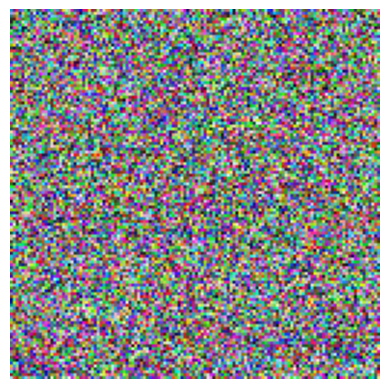

In [ ]:
img = create_noisy_image()
print("Imagen ruidosa inicial:")
img.display_image()

Loss: 29280.5703125


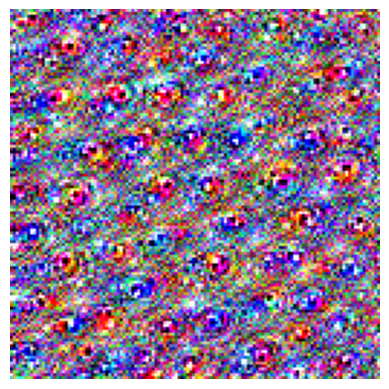

In [ ]:
img.preprocess_image()

# Probemos con el kernel 4 de la capa block4_conv1
layer_name = "block4_conv1"
kernel_idx = 4
learning_rate_value = 100

for i in range(200):
    img.processed_img = gradient_ascent_step(img.processed_img, layer_name, kernel_idx, feature_extractor, learning_rate=learning_rate_value)
    if i % 10 == 0:
        print(f"Loss: {activation_loss(img.processed_img, layer_name, kernel_idx, feature_extractor)}")
        # Deproceso y muestro la imagen
        deprocessed = img.deprocess_image()
        plt.imshow(deprocessed)
        plt.axis("off")
        plt.show()
        clear_output(wait=True)

Funciona! Parecería que la máxima activación de este kernel esta dada por una especie de ojos?

Ahora corramos esto para varias layers/kernels

In [ ]:
layer_names = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]

In [ ]:
for layer_name in layer_names:
    for kernel_idx in range(10, 20):
        max_kernel_activation(layer_name, kernel_idx, feature_extractor, n_its=1000, learning_rate=100, savefile=True)

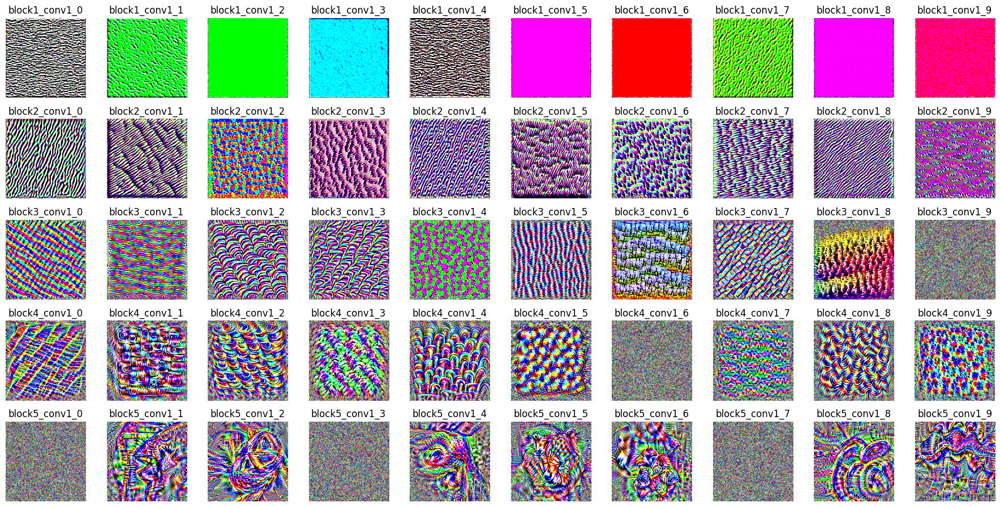

In [ ]:
# Voy a visualizar las imagenes que maximizan la activacion de los kernels
n=10
plt.figure(figsize=(18, 18))
for i, file_name in enumerate(layer_names):
    for j in range(n):
        plt.subplot(n, n, i*n + j + 1)
        img = PIL.Image.open(f"max_kernels/kernel_{file_name}_{j+10}.png")
        plt.title(f"{file_name}_{j}")
        plt.imshow(img)
        plt.axis("off")
plt.tight_layout()

Muy interesante, se ve a simple vista que la complejidad de las estructuras que aparecen aumenta con la capa. Además, se ven algunas imagenes que son solo ruido. Me imagino que estas son kernels que están muertos y no se activan con nada (o quizás mi learning rate era muy alto y no pude encontrar su activación)

## Parte 2: Neural Style Transfer

Algunas funciones útiles

In [ ]:
def gram_matrix(input_tensor):
    # Robadísimo de un ejemplo de keras. Pero en el fondo una gram matrix es
    # una matriz kxk donde cada elemento es el producto escalar de dos vectores.
    # Estos vectores son los features de una capa convolucional
    # (es similar a una matriz de correlación).
    input_tensor = tf.expand_dims(input_tensor, axis=0)  # Add extra dimension
    result = tf.linalg.einsum("bijc,bijd->bcd", input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / num_locations

# Que es el style loss?
# 1. Hago feed forward con la imagen de estilo hasta alguna capa convolucional
# 2. Calculo la matriz de Gram de esa capa con ese input
# 3. Hago lo mismo para la imagen que estoy generando
# 4. El loss es el mse de esas dos imagenes
# El style loss se suele calcular en varias capas, asi agarro distintas propiedades,
# complejidad y tamaño de los estilos
def style_loss(style, generated):
    S = gram_matrix(style)
    C = gram_matrix(generated)
    channels = 3
    return tf.reduce_mean(tf.square(S - C)) / (4.0 * (channels**2))

# Content loss es más fácil: feedeo la imagen de contenido hasta una de las capas
# finales y calculo su activación. Luego hago lo mismo para la imagen que estoy
# generando y la loss es el mse de estas dos activaciones.
def content_loss(base, generated):
    return tf.reduce_mean(tf.square(generated - base))

# Total variation es un filtro suavizante para que la imagen final no tenga
# tanto ruido. Calcula las variaciones en el valor de un pixel con sus vecinos.
def total_variation_loss(x):
    return tf.image.total_variation(x)


def compute_loss(
    generated_image,
    base_image,
    style_reference_image,
    feature_extractor,
    content_layer_name,
    style_layer_names,
    content_weight,
    style_weight,
    total_variation_weight,
):
    input_tensor = tf.concat(
        [base_image, style_reference_image, generated_image], axis=0
    )
    features = feature_extractor(input_tensor)

    loss = tf.zeros(shape=())

    # Content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Total variation loss
    loss += total_variation_weight * total_variation_loss(generated_image)
    return loss

@tf.function
def compute_loss_and_grads(
    generated_image,
    base_image,
    style_reference_image,
    feature_extractor,
    content_layer_name,
    style_layer_names,
    content_weight,
    style_weight,
    total_variation_weight,
):
    with tf.GradientTape() as tape:
        loss = compute_loss(
            generated_image,
            base_image,
            style_reference_image,
            feature_extractor,
            content_layer_name,
            style_layer_names,
            content_weight,
            style_weight,
            total_variation_weight,
        )
    grads = tape.gradient(loss, generated_image)
    return loss, grads


def training_loop(content_name, style_name, learning_rate_value, content_layer_name, style_layer_names, content_weight, style_weight, total_variation_weight, start='content', img_nrows=200, epochs=50, steps_per_epoch=20, savename=None):
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate_value, beta_1=0.99, epsilon=1e-1)

    # Cargo las imagenes
    content = ImageLoader(url=content_urls[content_name], img_nrows=img_nrows)
    style = ImageLoader(url=style_urls[style_name], img_nrows=img_nrows)

    # A veces quiero empezar con una imagen con ruido (para explorar algunas cosas)
    if start == 'random':
        generated = RandomImage(img_nrows=img_nrows, img_ncols=content.img_ncols)
    # Para hacer un lindo style transfer, lo mejor es ya empezar con la imagen de contenido original e ir agregandole estilo
    if start == 'content':
        generated = ImageLoader(url=content_urls[content_name], img_nrows=img_nrows)

    # Reescaleo el estilo para que las 3 tengan el mismo tamaño (se reescalea en el preprocessing en realidad)
    style.img_ncols = content.img_ncols

    # Las pongo como tf.Variable porque sino no se pueden actualizar
    base_image = tf.Variable(content.preprocess_image())
    style_image = tf.Variable(style.preprocess_image())
    generated_image = tf.Variable(generated.preprocess_image())

    step = 0
    loss_history = []

    # Training loop
    for i in range(1, epochs + 1):
        print("Start of epoch %d" % i)
        for _ in range(steps_per_epoch):
            step += 1
            loss, grads = compute_loss_and_grads(
                generated_image, base_image, style_image, feature_extractor, content_layer_name, style_layer_names, content_weight, style_weight, total_variation_weight
            )
            optimizer.apply_gradients([(grads, generated_image)])
            loss_history.append(loss)
            print(".", end='', flush=True)
        generated.processed_img = generated_image
        img = generated.deprocess_image()
        clear_output(wait=True)
        print(f"Train step: {step}, loss: {loss}")
        display(PIL.Image.fromarray(img))
        plt.plot(loss_history)
        plt.show()
        print("Iteration %d: loss=%.2f" % (i, loss))
    # Guardo la imagen final
    if savename:
        plt.imsave(f"style_transfer/{savename}.png", img)
    else:
        plt.imsave(f"style_transfer/final_{content_name}_{style_name}.png", img)
    return img, loss_history


In [ ]:
model = vgg19.VGG19(weights="imagenet", include_top=False)

outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

# Layers que vamos a usar para calcular el style loss.
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
# Layer que vamos a usar para el content loss (notar que es de las últimas).
content_layer_name = "block5_conv2"

# El peso que tiene cada tipo de loss en la loss final
total_variation_weight = 10
style_weight = 10000
content_weight = 10

# Esto es la altura de la imagen que queremos generar
img_nrows = 300

epochs = 150
steps_per_epoch = 50

# Utilizamos un optimizador Adam porque es el más común (solo probé con SGD
# además de este y no funcionaba muy bien)
learning_rate_value = 1.

80134624/80134624 [==============================] - 1s 0us/step


Train step: 7500, loss: [1.2962924e+09]


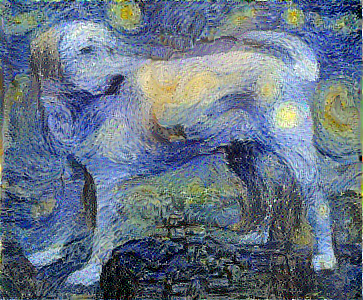

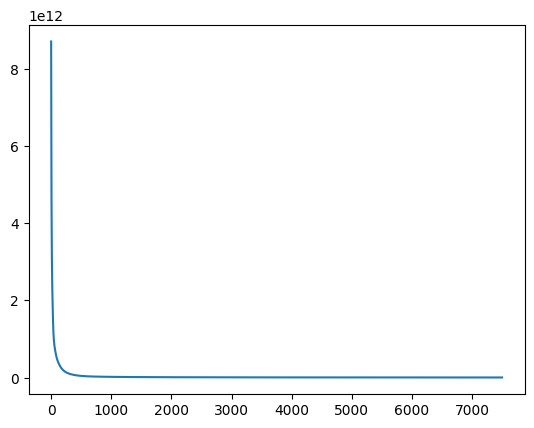

Iteration 150: loss=1296292352.00


In [ ]:
# Así creamos un style transfer de la foto del labrador con el cuadro de Van Gogh
content_name = 'labrador'
style_name = 'van_gogh_starry_night'

img, loss_history = training_loop(content_name, style_name, learning_rate_value, content_layer_name, style_layer_names, content_weight, style_weight, total_variation_weight, start='content', img_nrows=img_nrows, epochs=epochs, steps_per_epoch=steps_per_epoch)

Train step: 2000, loss: [1.2589173e+11]


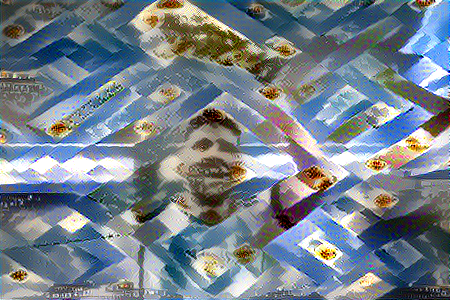

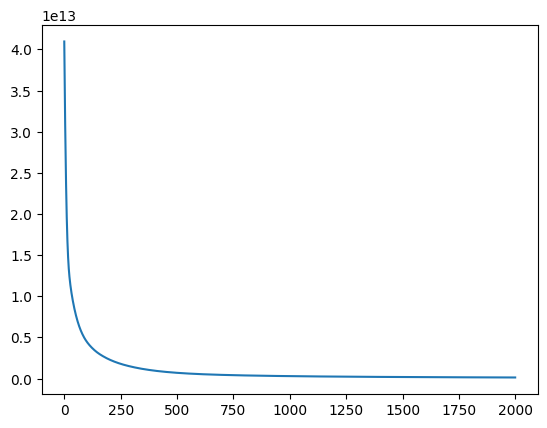

Iteration 40: loss=125891731456.00


In [ ]:
epochs = 150
# Ahora lo hacemos para 2 contenidos y varios estilos
for content_name in ['gato1', 'messi']:
    for style_name in ['van_gogh_starry_night', 'munch_scream', 'fire', 'amadeo_cardoso', 'derkovits_woman_head', 'islamic', 'mandala', 'arg']:
        img, loss_history = training_loop(content_name, style_name, learning_rate_value, content_layer_name, style_layer_names, content_weight, style_weight, total_variation_weight, start='content', img_nrows=img_nrows, epochs=epochs, steps_per_epoch=steps_per_epoch)


Style transfers generados con VGG. (El codigo para armar este plot está en plots.ipynb)

![plot](style_transfer/results_vgg19.png)

Que imagenes maximizan el content y el estilo? Empezamos con una imagen ruidosa y vemos que hace cada capa/filtro

In [ ]:
img_nrows = 200

epochs = 30
steps_per_epoch = 200

learning_rate_value = 1.

In [1]:
content_weight = 100.
style_weight = 0.
total_variation_weight = 0.

# Maximizo el content
img, loss = training_loop('messi', 'kandinsky_composition_7', learning_rate_value, content_layer_name, style_layer_names, content_weight, style_weight, total_variation_weight, start='random', img_nrows=img_nrows, epochs=epochs, steps_per_epoch=steps_per_epoch, savename='messi_from_noise')

NameError: name 'training_loop' is not defined

Imagen de Messi reconstruida (corriendo más tiempo mejora)

![content learn](style_transfer/messi_from_noise.png)

Train step: 4000, loss: [2429407.5]


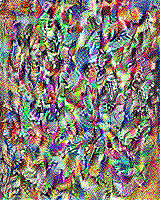

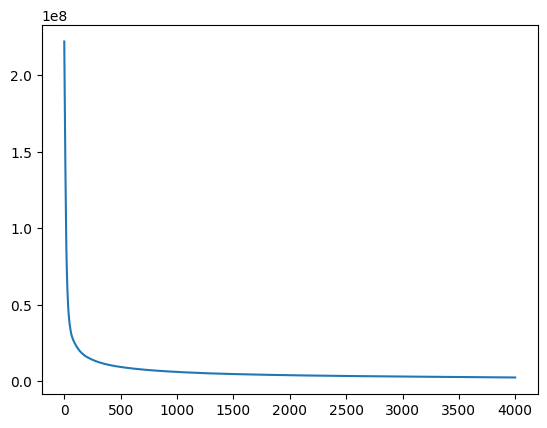

Iteration 20: loss=2429407.50


In [ ]:
content_weight = 0.
style_weight = 100.
total_variaton_weight = 0.

epochs = 20

# Maximizo el estilo para cada capa
for layer in style_layer_names:
    img, _ = training_loop('gato1', 'kandinsky_composition_7', learning_rate_value, content_layer_name, [layer], content_weight, style_weight, total_variation_weight, start='random', img_nrows=img_nrows, epochs=epochs, steps_per_epoch=steps_per_epoch, savename=f'kandinsky_from_noise_layer_{layer}')

Cuadro de Kandinsky e imágenes que minimizan el style loss en cada capa

![Style learn](style_transfer/kandinsky_from_noise_layers.png)

## Parte 3: Probemos ahora con otra red: EfficientNet

Efficient net es otra familia de redes pre entrenadas que están en keras. Son más nuevas, tienen muchos parámetros y tienen mayor precisión en el dataset Imagenet.

In [ ]:
model = keras.applications.EfficientNetV2S(include_top=False, weights='imagenet')

outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

82420632/82420632 [==============================] - 1s 0us/step


In [ ]:
# Uso una de las últimas layers como content layer
content_layer_name = "block6o_activation"

# Agarré algunas layers del principio e intermedias para el style. Reamente las
# elegí medio aleatoriamente, seguro se puede mejorar el resultado estudiando
# cuidadosamente que layers elegir acá.
style_layer_names = ['block1a_project_conv',
                'block1b_project_conv',
                'block2a_expand_conv',
                'block2a_project_conv',
                'block2b_expand_conv',
                'block2b_project_conv',
                'block2c_expand_conv',
                'block2c_project_conv',
                'block2d_expand_conv',
                'block2d_project_conv',
                'block3a_expand_conv',
                'block3a_project_conv',
                'block3b_expand_conv',
                'block3d_expand_conv',
                'block3d_project_conv',
                'block4a_expand_conv',
                'block4a_project_conv',
                'block4b_expand_conv',
                'block4b_project_conv',
                'block4c_expand_conv',
                'block4d_project_conv',
                'block4e_project_conv',
                'block4f_expand_conv',
                'block4f_project_conv']

# Pesos de los diferentes tipos de loss
total_variation_weight = 1e-3
style_weight = 1e4
content_weight = 100

img_nrows = 300

epochs = 150
steps_per_epoch = 50

learning_rate_value = .5

Train step: 7500, loss: [40280.242]


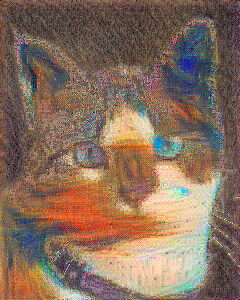

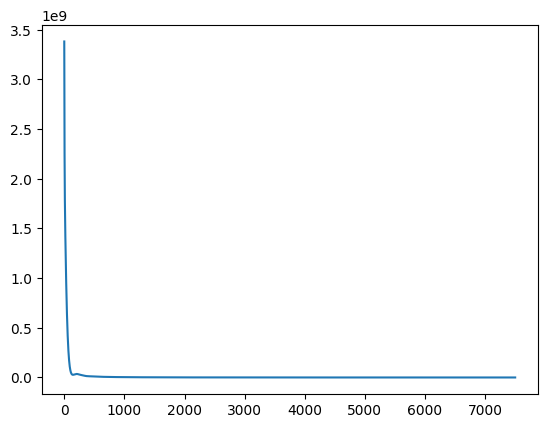

Iteration 150: loss=40280.24


In [ ]:
content_name = 'gato1'
style_name = 'munch_scream'

img, loss_history = training_loop(content_name, style_name, learning_rate_value, content_layer_name, style_layer_names, content_weight, style_weight, total_variation_weight, start='content', img_nrows=img_nrows, epochs=epochs, steps_per_epoch=steps_per_epoch, savename=f"final_{content_name}_{style_name}_effnet.png")

Train step: 7500, loss: [91846.08]


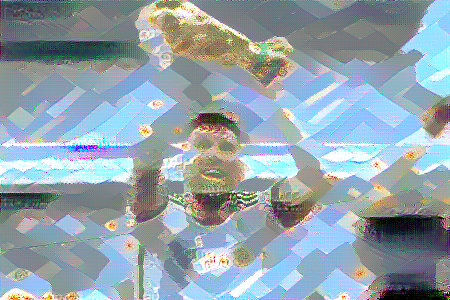

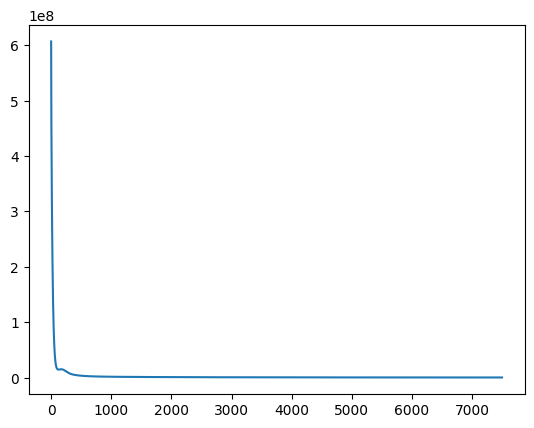

Iteration 150: loss=91846.08


In [ ]:
for content_name in ['gato1', 'messi']:
    for style_name in ['van_gogh_starry_night', 'munch_scream', 'mandala', 'arg']:
        img, loss_history = training_loop(content_name, style_name, learning_rate_value, content_layer_name, style_layer_names, content_weight, style_weight, total_variation_weight, start='content', img_nrows=img_nrows, epochs=epochs, steps_per_epoch=steps_per_epoch, savename=f"final_{content_name}_{style_name}_effnet")

![effenet results](style_transfer/results_effnet.png)